# Metadata

```yaml
Course:    DS 5001
Module:    12 Lab
Topic:     Classification with Expected Mutual Information (EMI)
Author:    R.C. Alvarado
Date:      16 April 2023 (revised)
```

# Overview

Mutual information measures how much information is communicated, on average, in one random variable about another.

For example, if I know that a document contains a given word, how much information does that word commuicate about the class of the document?

The formula is the following:

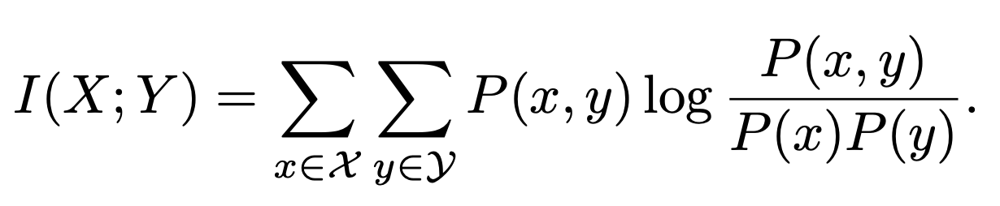

Note that this is an expectation of point-wise mutial information. 

Now, is we let $x$ stand for a word in a document, and $y$ for the label of a document, then we can estimate the values of each of the component probabilities and compute $I$.

To create a model, we can choose the value of $y$ with the maximum value for a given word $x$. Then we can apply this model to a test set.

# Set Up

## Configure

In [1]:
import configparser
config = configparser.ConfigParser()
config.read("../../../env.ini")
data_home = config['DEFAULT']['data_home']
output_dir = config['DEFAULT']['output_dir']
local_lib = config['DEFAULT']['local_lib']

In [2]:
data_prefix = 'winereviews'
data_path = f"{data_home}/{data_prefix}/{data_prefix}"

In [3]:
class Params:
    smooth_alpha = .1

## Import

In [4]:
import pandas as pd
import numpy as np
import plotly_express as px

# Preparation

## Get Data

In [5]:
X_test = pd.read_pickle(f"{data_path}-X_test.csv.pickle").sort_index()
X_train = pd.read_pickle(f"{data_path}-X_train.csv.pickle").sort_index()
y_test = pd.read_pickle(f"{data_path}-y_test.csv.pickle").sort_index()
y_train = pd.read_pickle(f"{data_path}-y_train.csv.pickle").sort_index()

In [6]:
DOC = pd.read_csv(f"{data_path}-DOC_UNSPLIT.csv").set_index('doc_id')

# Training

## Label $P(y)$

In [7]:
TOKEN_CLASS = X_train.join(y_train.to_frame('doc_label'), how='inner').groupby('doc_label').sum().T

In [8]:
TOKEN_CLASS

doc_label,N,P
000,8.660972,7.702925
008,0.297454,0.000000
01,0.630761,0.612814
02,0.726787,0.262296
03,0.686953,0.800397
...,...,...
öküzgözü,0.357785,0.000000
über,0.715432,1.150300
überaromatic,0.000000,0.424396
überbest,0.000000,0.286144


In [9]:
CLASS = (TOKEN_CLASS.sum() / TOKEN_CLASS.sum().sum()).to_frame('p_y')

In [10]:
CLASS

,p_y
doc_label,
N,0.467783
P,0.532217


## Word $P(x)$

In [11]:
X_train_smooth = X_train + Params.smooth_alpha

In [12]:
VOCAB = (X_train_smooth.sum() / X_train_smooth.sum().sum()).to_frame('p_x')
VOCAB.index.name = 'term_str'

In [13]:
VOCAB

,p_x
term_str,
000,0.000049
008,0.000048
01,0.000048
02,0.000048
03,0.000048
...,...
öküzgözü,0.000048
über,0.000048
überaromatic,0.000048


## Word and Label $P(x,y)$

In [14]:
TOKEN_CLASS_SMOOTH = TOKEN_CLASS + Params.smooth_alpha

In [15]:
TOKEN_CLASS_NARROW = (TOKEN_CLASS_SMOOTH / TOKEN_CLASS_SMOOTH.sum().sum()).unstack().to_frame('p_xy')

In [16]:
TOKEN_CLASS_NARROW.index.names = ['doc_label', 'term_str']

In [17]:
TOKEN_CLASS_NARROW

p_xy
doc_label term_str                  
N         000           5.850839e-05
          008           2.654319e-06
          01            4.880240e-06
          02            5.521533e-06
          03            5.255509e-06
...                              ...
P         öküzgözü      6.678299e-07
          über          8.349877e-06
          überaromatic  3.502075e-06
          überbest      2.578785e-06
          ürziger       2.520128e-06

[41274 rows x 1 columns]

## Point-wise mutual information

$pmi(x;y) = log_2(\large\frac{P(x,y)}{P(x)P(y)})$

In [18]:
TOKEN_CLASS_NARROW = TOKEN_CLASS_NARROW.join(VOCAB.p_x).join(CLASS.p_y)

In [19]:
TOKEN_CLASS_NARROW

p_xy       p_x       p_y
doc_label term_str                                      
N         000           5.850839e-05  0.000049  0.467783
          008           2.654319e-06  0.000048  0.467783
          01            4.880240e-06  0.000048  0.467783
          02            5.521533e-06  0.000048  0.467783
          03            5.255509e-06  0.000048  0.467783
...                              ...       ...       ...
P         öküzgözü      6.678299e-07  0.000048  0.532217
          über          8.349877e-06  0.000048  0.532217
          überaromatic  3.502075e-06  0.000048  0.532217
          überbest      2.578785e-06  0.000048  0.532217
          ürziger       2.520128e-06  0.000048  0.532217

[41274 rows x 3 columns]

In [20]:
TOKEN_CLASS_NARROW['pmi'] = np.log2(TOKEN_CLASS_NARROW.p_xy/(TOKEN_CLASS_NARROW.p_x * TOKEN_CLASS_NARROW.p_y))

In [21]:
TOKEN_CLASS_NARROW

p_xy       p_x       p_y       pmi
doc_label term_str                                                
N         000           5.850839e-05  0.000049  0.467783  1.363856
          008           2.654319e-06  0.000048  0.467783 -3.091150
          01            4.880240e-06  0.000048  0.467783 -2.212966
          02            5.521533e-06  0.000048  0.467783 -2.034734
          03            5.255509e-06  0.000048  0.467783 -2.106197
...                              ...       ...       ...       ...
P         öküzgözü      6.678299e-07  0.000048  0.532217 -5.268140
          über          8.349877e-06  0.000048  0.532217 -1.624617
          überaromatic  3.502075e-06  0.000048  0.532217 -2.877513
          überbest      2.578785e-06  0.000048  0.532217 -3.318969
          ürziger       2.520128e-06  0.000048  0.532217 -3.352160

[41274 rows x 4 columns]

In [22]:
PMI = TOKEN_CLASS_NARROW.pmi.unstack().T

In [23]:
PMI

doc_label,N,P
term_str,,
000,1.363856,1.010605
008,-3.091150,-5.268113
01,-2.212966,-2.435014
02,-2.034734,-3.411255
03,-2.106197,-2.098088
...,...,...
öküzgözü,-2.887296,-5.268140
über,-2.055081,-1.624617
überaromatic,-5.081996,-2.877513


## EMI

In [24]:
TOKEN_CLASS_NARROW['emi'] = TOKEN_CLASS_NARROW.p_xy * TOKEN_CLASS_NARROW.pmi

In [25]:
EMI = TOKEN_CLASS_NARROW.emi.unstack().T

In [26]:
EMI

doc_label,N,P
term_str,,
000,0.000080,0.000053
008,-0.000008,-0.000004
01,-0.000011,-0.000012
02,-0.000011,-0.000008
03,-0.000011,-0.000013
...,...,...
öküzgözü,-0.000009,-0.000004
über,-0.000011,-0.000014
überaromatic,-0.000003,-0.000010


# Testing

In [27]:
X_test.dot(EMI)

doc_label,N,P
doc_id,,
32,0.012064,0.010850
75,0.005991,0.007959
82,0.023904,0.019595
122,0.009465,0.008804
127,0.025345,0.024306
...,...,...
129941,0.014867,0.010027
129954,0.015457,0.012092
129955,0.015118,0.012754


In [28]:
y_hat = X_test.dot(EMI).idxmax(1)

# Evaluation

In [29]:
RESULT = pd.concat([y_test, y_hat], axis=1)
RESULT.columns = ['doc_label', 'prediction']

In [30]:
RESULT['result'] = RESULT.doc_label == RESULT.prediction

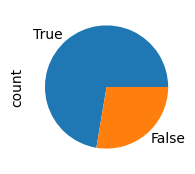

In [31]:
RESULT.value_counts('result').plot.pie(figsize=(2,2));

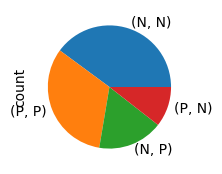

In [32]:
RESULT.value_counts(['prediction','doc_label']).plot.pie(figsize=(2,2));

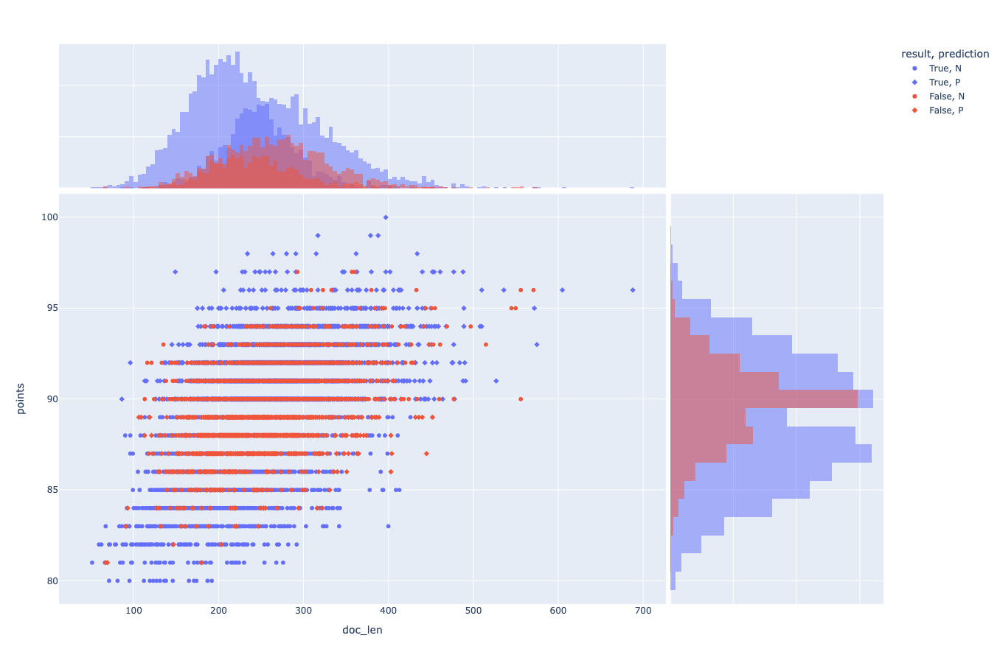

In [33]:
px.scatter(RESULT.join(DOC[['doc_content','points','doc_len']], how='inner').reset_index(), 'doc_len', 'points', color='result', symbol='prediction',
           height=900, width=1000, marginal_x='histogram', marginal_y='histogram')

In [34]:
CM = RESULT.value_counts(['prediction','doc_label']).unstack()

In [35]:
CM

doc_label,N,P
prediction,,
N,3191,1368
P,844,2597


In [36]:
def get_results(CM, model_id):
    
    R = pd.DataFrame(index=[model_id])
    R.index.name = 'model_id'
    
    # COUNTS
    R['TN'] = CM.iloc[0,0]   # correct rejections
    R['FN'] = CM.iloc[0,1]   # Type II errors or misses
    R['TP'] = CM.iloc[1,1]   # hits
    R['FP'] = CM.iloc[1,0]   # Type I errors or false alarms
    R['T'] = R.TP + R.TN     # All True
    R['F'] = R.FP + R.FN     # All False
    R['ALL'] = R['T'] + R.F  # All
    
    assert R.ALL.values[0] == CM.sum().sum()
    
    # RATIOS
    R['ACC'] = R['T'] / R.ALL                        # (Simple) Accuracy
    R['TPR'] = R.TP / (R.TP + R.FN)                  # Recall or Sensitivity
    R['TNR'] = R.TN / (R.TN + R.FP)                  # Specificity
    R['PPV'] = R.TP / (R.TP + R.FP)                  # Precision or Positive predictive value 
    R['BA'] = (R.TNR + R.TPR) / 2                    # Balanced Accuracy
    R['F1'] = (2 *  R.TP) / (2 * R.TP + R.FP + R.FN) # F-score where F = 1

    return R

In [37]:
R = get_results(CM, 'mi')
R.index.name = 'model_id'

In [38]:
R.T.style.format(precision=3)

model_id,mi
TN,3191.000
FN,1368.000
TP,2597.000
FP,844.000
T,5788.000
F,2212.000
ALL,8000.000
ACC,0.724
TPR,0.655
TNR,0.791


# Extract Sentiment

In [39]:
SALEX = PMI
SALEX['valence'] = SALEX.P - SALEX.N
SALEX = SALEX.sort_values('valence')

In [40]:
SALEX['polarity'] = np.sign(SALEX.valence)

In [41]:
from sklearn.preprocessing import MinMaxScaler

In [42]:
scaler = MinMaxScaler(feature_range=(-1, 1))
SALEX['normalized'] = scaler.fit_transform(SALEX[['valence']])

In [43]:
SALEX.sort_values('valence', ascending=False).head(20)

doc_label,N,P,valence,polarity,normalized
term_str,,,,,
2030,-5.096468,3.074488,8.170956,1.0,1.000000
92,-5.093346,2.731885,7.825231,1.0,0.957055
2027,-5.090639,2.349234,7.439872,1.0,0.909186
oakville,-5.085484,1.098381,6.183865,1.0,0.753168
2033,-5.085368,1.052793,6.138161,1.0,0.747491
2031,-5.085273,1.014278,6.099551,1.0,0.742694
glorious,-5.085151,0.963391,6.048542,1.0,0.736358
extraordinary,-5.085095,0.939574,6.024670,1.0,0.733393
exceptional,-3.460969,2.436040,5.897010,1.0,0.717535


In [44]:
SALEX.sort_values('valence', ascending=True).head(20)

doc_label,N,P,valence,polarity,normalized
term_str,,,,,
informal,2.652220,-5.277564,-7.929785,-1.0,-1.000000
watery,2.325319,-5.275606,-7.600926,-1.0,-0.959150
dilute,2.323813,-5.275598,-7.599412,-1.0,-0.958962
diluted,1.928848,-5.273759,-7.202607,-1.0,-0.909672
weedy,1.662248,-5.272775,-6.935022,-1.0,-0.876433
raspy,1.615814,-5.272621,-6.888435,-1.0,-0.870646
scouring,1.552352,-5.272419,-6.824771,-1.0,-0.862738
strange,1.137981,-5.271298,-6.409279,-1.0,-0.811126
chemical,0.996500,-5.270983,-6.267483,-1.0,-0.793512


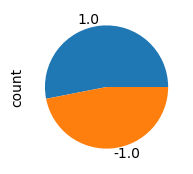

In [45]:
SALEX.polarity.value_counts().plot.pie(figsize=(2,2));

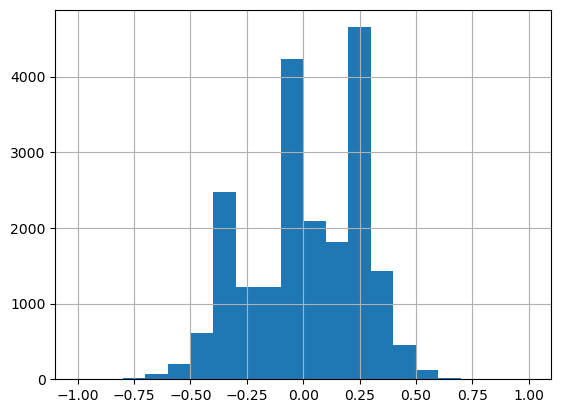

In [46]:
SALEX.normalized.hist(bins=20);

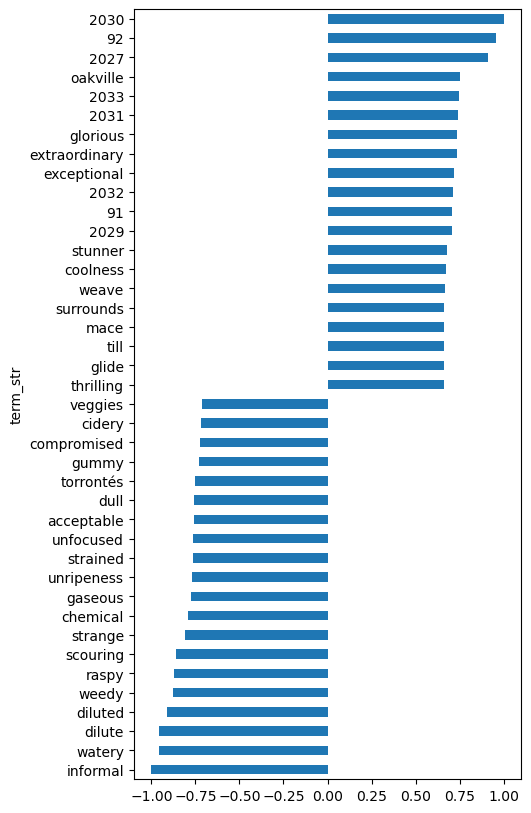

In [47]:
pd.concat([SALEX.normalized.head(20),SALEX.normalized.tail(20)]).plot.barh(figsize=(5,10));

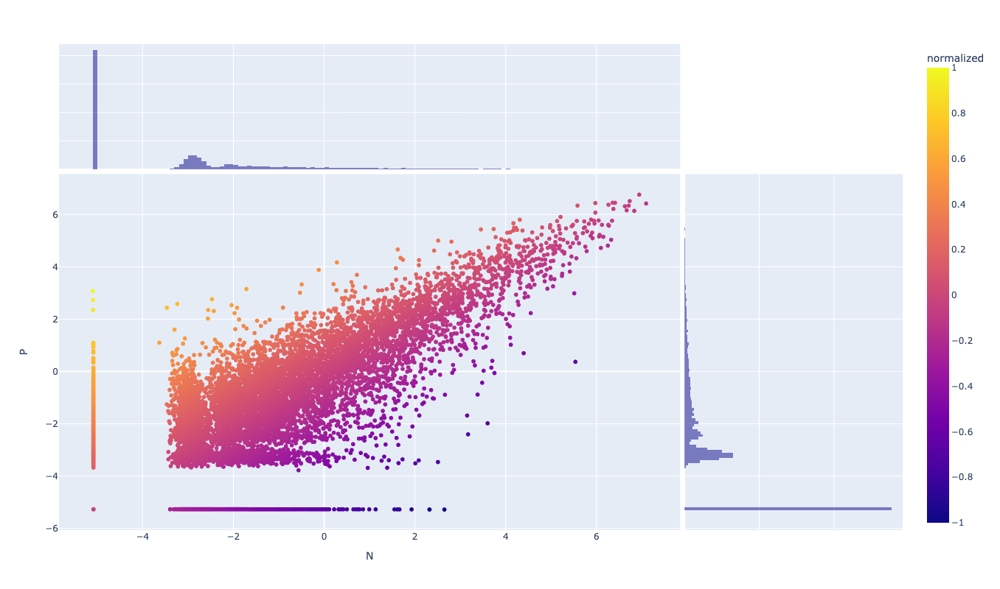

In [48]:
px.scatter(SALEX.reset_index(), 'N', 'P', 
           color='normalized', 
           height=800, width=1000, 
           hover_name='term_str', 
           marginal_x='histogram', marginal_y='histogram')

# Save

In [49]:
SALEX[['valence','polarity','normalized']].to_csv(f"{data_path}-MI_SALEX.csv")

In [50]:
R.to_csv(f"{data_path}-MI_RESULT.csv", index=True)